In [1]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [1]:
pip install Pillow

In [3]:
pip install pykrige

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 852.6/852.6 kB 9.1 MB/s eta 0:00:00


In [4]:
pip install pykrige matplotlib

In [5]:
!pip install basemap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 860.7/860.7 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.5/30.5 MB 43.0 MB/s eta 0:00:00


In [6]:
!pip install basemap-data

In [7]:
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
df=pd.read_csv('/content/drive/MyDrive/gujarat.csv')

In [9]:
df.drop('State', axis=1, inplace=True)

In [10]:
#make new dataframe with states
a=list(range(len(df.columns)))
df.columns=a

districts=[]
for i in list(df[0]):
    if i in districts:
        continue
    else:
        districts.append(i)

moisture=pd.DataFrame(districts)

for i in range(1,(df[0]=='Ahmadabad').sum()+1):
    moisture[i]=''


<ipython-input-10-56adddcaedfd>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  moisture[i]=''


In [12]:
df[2][0:(df[0]=='Ahmadabad').sum()]

0       24.80
1       24.07
2       23.39
3       22.39
4       21.28
        ...  
1818    22.68
1819    21.89
1820    20.81
1821    19.91
1822    19.14
Name: 2, Length: 1823, dtype: float64

In [13]:
li=list(moisture[0])

moisture.drop(moisture.columns[0], axis=1, inplace = True)

p=0
k=(df[0]=='Ahmadabad').sum()
k
for i in range(len(moisture.index)):
  moisture.loc[i]=list(df[2][p:k])
  p=k
  k=p+(df[0]=='Ahmadabad').sum()

moisture.insert(0,'0',li)

<ipython-input-13-e715975d2e80>:13: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  moisture.insert(0,'0',li)


In [14]:
date=[]
for i in list(df[1]):
    if i in date:
        continue
    else:
        date.append(i)
columns=['district']
columns=columns+date

moisture.columns=columns

In [15]:
moisture.to_csv('/content/drive/MyDrive/gujarat_moisture.csv')

In [16]:
df1=pd.read_csv('/content/drive/MyDrive/gujarat_moisture.csv')
df1.drop(['Unnamed: 0'], axis=1, inplace=True)

In [17]:
x=[]
h=['Jan','Feb','Mar','Apr','May','Jun','July','Aug','Sept','Oct','Nov','Dec']
l=[]
for i in df1.columns:
  if i=='district':
    continue
  else:
    k = i.split('-')
    l=[]
    l.append(h[int(k[1])-1])
    l.append(k[2])
    l.append(k[0])
    l="".join(l)
    x.append(l)

colu=['district']
colu=colu+x
df1.columns=colu


In [18]:
df1.to_csv('/content/drive/MyDrive/gujarat_moisture_datetype.csv')

In [19]:
df3=pd.read_csv('/content/drive/MyDrive/gujarat_moisture_datetype.csv')
df3.drop(['Unnamed: 0'], axis=1, inplace=True)

In [20]:
import pandas as pd
from geopy.geocoders import Nominatim

# Create a list of district names in Gujarat
districts = list(df3.district)

# Initialize the geocoder
geolocator = Nominatim(user_agent="district_geocoder")

# Create empty lists to store latitude and longitude
latitude = []
longitude = []
district_mapping={'Arvalli':'aravalli','Chhotaudepur':'Chhota Udepur','Dohad':'dahod'}
# Iterate through the list of districts and geocode each one
for district in districts:
    if district in district_mapping:
        # If it's a misspelling, replace it with the correct name
        district=district_mapping[district]
    else:
        # If it's not a misspelling, keep the original name
        district=district

    location = geolocator.geocode(district + ", Gujarat, India")

    if location:
        latitude.append(location.latitude)
        longitude.append(location.longitude)
    else:
        latitude.append(None)
        longitude.append(None)

district_df = pd.DataFrame({"District": districts, "Latitude": latitude, "Longitude": longitude})

# Print or save the DataFrame as needed
print(district_df)

           District   Latitude  Longitude
0         Ahmadabad  23.021624  72.579707
1            Amreli  20.866667  70.750000
2             Anand  22.558656  72.962723
3           Arvalli  23.483459  73.398812
4      Banas Kantha  24.250000  72.500000
5           Bharuch  21.708043  72.995694
6         Bhavnagar  21.771884  72.141645
7             Botad  22.168600  71.668500
8      Chhotaudepur  22.314874  74.014107
9              Dang  20.788172  73.709203
10  Devbhumi Dwarka  22.244476  68.968002
11            Dohad  22.835879  74.255682
12      Gandhinagar  23.223288  72.649227
13      Gir Somnath  21.110787  70.521988
14         Jamnagar  22.473242  70.055210
15         Junagadh  21.517410  70.464275
16          Kachchh  23.583333  70.000000
17            Kheda  22.750000  72.833333
18         Mahesana  23.601556  72.386798
19        Mahisagar  23.191697  73.662635
20            Morbi  22.817666  70.834593
21          Narmada  21.738304  73.627360
22          Navsari  20.952407  72

In [21]:
df3['Latitude']=district_df['Latitude']
df3['Longitude']=district_df['Longitude']

In [22]:
df3.to_csv('/content/drive/MyDrive/gujarat_moisture_latlon.csv')

In [23]:
k=33
for i in [16,4,9,11]:
  d=list(df3.loc[i])
  print(d)
  df3.loc[k]=d
  k+=1

['Kachchh', 19.62, 19.06, 18.49, 17.94, 17.37, 16.99, 16.53, 16.15, 15.72, 15.4, 14.97, 14.75, 14.45, 14.23, 13.99, 15.2, 14.71, 14.14, 14.09, 13.68, 13.48, 13.29, 13.16, 12.8, 24.62, 25.28, 23.83, 23.5, 24.67, 23.94, 22.84, 23.0, 22.3, 21.53, 21.0, 20.08, 19.62, 18.85, 18.75, 18.63, 18.21, 17.54, 16.93, 16.44, 16.1, 15.57, 15.93, 15.14, 14.76, 14.37, 13.88, 13.47, 13.2, 12.84, 12.29, 11.7, 11.09, 10.5, 9.93, 9.33, 8.82, 8.63, 8.16, 7.71, 7.28, 6.88, 6.5, 6.15, 5.82, 5.5, 5.24, 4.95, 4.68, 4.43, 4.18, 3.95, 3.75, 3.55, 3.4, 3.22, 3.06, 2.91, 2.77, 2.64, 2.53, 2.42, 2.32, 2.22, 2.12, 2.04, 1.95, 1.88, 1.81, 1.75, 1.68, 1.62, 1.57, 1.51, 1.46, 1.42, 1.38, 1.34, 1.3, 1.26, 1.23, 1.21, 1.18, 1.15, 1.13, 1.1, 1.08, 1.06, 1.09, 1.07, 1.05, 1.03, 1.01, 1.0, 0.99, 0.97, 0.95, 0.94, 0.93, 0.92, 0.91, 0.91, 0.9, 0.89, 0.88, 0.88, 0.87, 0.87, 0.86, 0.85, 0.84, 0.83, 0.82, 0.81, 0.86, 0.86, 0.85, 0.84, 0.84, 0.83, 0.82, 1.11, 1.09, 1.07, 1.05, 1.03, 1.01, 1.0, 0.98, 0.96, 0.95, 0.94, 0.93, 0.92, 0

In [24]:
k=33
for i in ['West','North','South','East']:
  df3['district'][k]=i
  k+=1

<ipython-input-24-c46d238a9046>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3['district'][k]=i


In [25]:
df3.to_csv('/content/drive/MyDrive/gujarat_moisture_latlon_extream.csv')

In [26]:
df4=pd.read_csv('/content/drive/MyDrive/gujarat_moisture_latlon_extream.csv')

In [27]:
ff=pd.read_csv('/content/drive/MyDrive/gujarat_moisture.csv')

In [28]:
kf=ff.drop(['Unnamed: 0','district'],axis=1)

In [29]:
# Transpose the DataFrame
df5 = kf.transpose()


In [30]:
list1=list(ff.district)

In [42]:
y=[]
m=[]
Month=[]
j=0
df5.index = pd.to_datetime(df5.index)
new_df=pd.DataFrame(columns=list(range(len(df5.columns))))
for year in df5.index.year.unique():
  year_data = df5[df5.index.year == year]
  for month in year_data.index.month.unique():
    month_data = year_data[year_data.index.month == month]
    j+=1
    for i in month_data.columns:
      average = month_data[i].mean()
      new_df.loc[j, i] = average
      if i == 0:
        y.append(year)
        m.append(month)


for i in range(len(y)):
    combined_element = f"s{y[i]}{m[i]}"
    Month.append(combined_element)

new_df.index=Month

arc_df=new_df.transpose()
arc_df.insert(0, 'district', list1)
arc_df['Latitude']=district_df['Latitude']
arc_df['Longitude']=district_df['Longitude']
k=33
for i in [16,4,9,11]:
  d=list(arc_df.loc[i])
  print(d)
  arc_df.loc[k]=d
  k+=1
k=33
for i in ['West','North','South','East']:
  arc_df['district'][k]=i
  k+=1


['Kachchh', 17.768749999999997, 18.12483870967742, 12.126666666666665, 2.8558064516129034, 1.058, 0.9158064516129032, 0.8812903225806452, 0.8507142857142858, 0.8238709677419356, 0.3106666666666665, 0.326774193548387, 1.9323333333333332, 7.417741935483869, 24.136774193548383, 22.973333333333336, 15.475806451612904, 12.04, 7.611290322580645, 4.400322580645161, 3.7279310344827583, 3.6190322580645153, 3.6586666666666665, 3.3803225806451604, 8.869666666666665, 19.58516129032258, 27.63290322580645, 24.275000000000002, 12.478709677419355, 8.286666666666665, 5.377741935483872, 4.128387096774193, 3.541428571428571, 5.077419354838711, 6.521999999999999, 9.315483870967741, 12.042000000000002, 20.453548387096774, 12.048333333333336, 28.8, 26.105, 11.229999999999999, 12.658333333333333, 7.7749999999999995, 5.263548387096774, 4.337, 4.021333333333334, 6.363333333333332, 26.189354838709672, 28.06903225806452, 24.157999999999998, 10.386774193548389, 5.376206896551723, 4.74032258064516, 4.9893333333333

<ipython-input-42-1543c4345750>:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arc_df['district'][k]=i


In [43]:
arc_df.to_csv('/content/drive/MyDrive/gujarat_moisture_Analysis.csv')

In [37]:
y=[]
m=[]
Month=[]
j=0
df5.index = pd.to_datetime(df5.index)
new_df=pd.DataFrame(columns=list(range(len(df5.columns))))
for year in df5.index.year.unique():
  year_data = df5[df5.index.year == year]
  for month in year_data.index.month.unique():
    month_data = year_data[year_data.index.month == month]
    j+=1
    for i in month_data.columns:
      average = month_data[i].mean()
      new_df.loc[j, i] = average
      if i == 0:
        y.append(year)
        m.append(month)


for i in range(len(y)):
    combined_element = f"{y[i]}{m[i]}"
    Month.append(combined_element)

new_df.index=Month

arc_df=new_df.transpose()
arc_df.insert(0, 'district', list1)

arc_df['Latitude']=district_df['Latitude']
arc_df['Longitude']=district_df['Longitude']

In [ ]:
k=33
for i in [16,4,9,11]:
  d=list(arc_df.loc[i])
  print(d)
  arc_df.loc[k]=d
  k+=1

['Kachchh', 17.768749999999997, 18.12483870967742, 12.126666666666665, 2.8558064516129034, 1.058, 0.9158064516129032, 0.8812903225806452, 0.8507142857142858, 0.8238709677419356, 0.3106666666666665, 0.326774193548387, 1.9323333333333332, 7.417741935483869, 24.136774193548383, 22.973333333333336, 15.475806451612904, 12.04, 7.611290322580645, 4.400322580645161, 3.7279310344827583, 3.6190322580645153, 3.6586666666666665, 3.3803225806451604, 8.869666666666665, 19.58516129032258, 27.63290322580645, 24.275000000000002, 12.478709677419355, 8.286666666666665, 5.377741935483872, 4.128387096774193, 3.541428571428571, 5.077419354838711, 6.521999999999999, 9.315483870967741, 12.042000000000002, 20.453548387096774, 12.048333333333336, 28.8, 26.105, 11.229999999999999, 12.658333333333333, 7.7749999999999995, 5.263548387096774, 4.337, 4.021333333333334, 6.363333333333332, 26.189354838709672, 28.06903225806452, 24.157999999999998, 10.386774193548389, 5.376206896551723, 4.74032258064516, 4.9893333333333

In [ ]:
k=33
for i in ['West','North','South','East']:
  arc_df['district'][k]=i
  k+=1

<ipython-input-36-7e590d855810>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  arc_df['district'][k]=i


In [9]:
from PIL import Image
import os
png_directory = r'/content/drive/MyDrive/gujarat_png'
png_files = [f for f in os.listdir(png_directory) if f.endswith('.png')]
png_files.sort()
output_gif_path = r'/content/drive/MyDrive/gujarat_moisture.gif'
frames = []
for png_file in png_files:
    png_file_path = os.path.join(png_directory, png_file)
    img = Image.open(png_file_path)
    frames.append(img)
frames[0].save(output_gif_path, save_all=True, append_images=frames[1:], duration=500, loop=0)

print(f'GIF created: {output_gif_path}')

GIF created: /content/drive/MyDrive/gujarat_moisture.gif


In [ ]:
arc_df.to_csv('/content/drive/MyDrive/gujarat_moisture_monthly.csv')

In [ ]:
# x = arc_df['Latitude']
# y = arc_df['Longitude']
# values = arc_df['2018-7']

# OK = OrdinaryKriging(x, y, values, variogram_model="spherical")

# # Define the grid for prediction
# gridx =df4['Latitude']
# gridy =df4['Longitude']

# # Perform Kriging Interpolation
# z, ss = OK.execute("grid", gridx, gridy)

# llcrnrlat=min_latitude=min(arc_df['Latitude'])
# urcrnrlat=max_latitude=max(arc_df['Latitude'])
# llcrnrlon=min_longitude=min(arc_df['Longitude'])
# urcrnrlon=max_longitude=max(arc_df['Longitude'])
# step=1

# parallels = np.arange(llcrnrlat, urcrnrlat, step)
# meridians = np.arange(llcrnrlon, urcrnrlon, step)

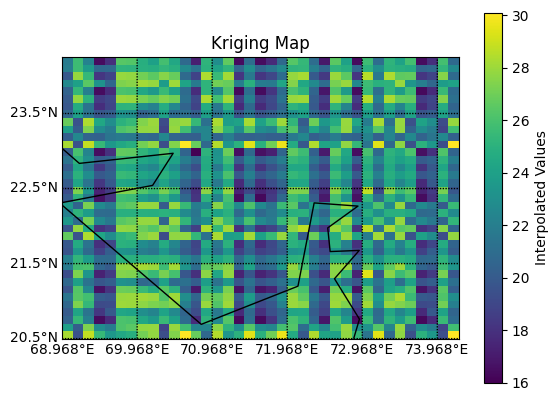

In [ ]:
# # Define the map projection and boundaries
# m = Basemap(projection='cyl', resolution='c', llcrnrlat=min_latitude, urcrnrlat=max_latitude, llcrnrlon=min_longitude, urcrnrlon=max_longitude)
# # Define the grid coordinates (replace with your actual grid)
# # gridx = df['Latitude']  # Replace with your grid x-coordinates
# # gridy = df['Longitude'] # Replace with your grid y-coordinates

# # Convert grid coordinates to map coordinates
# map_x, map_y = m(gridx, gridy)

# # Overlay kriging results on the map using imshow
# m.imshow(z, extent=(map_x.min(), map_x.max(), map_y.min(), map_y.max()), cmap='viridis', origin='upper')
# plt.colorbar(label="Interpolated Values")

# # Add map features, specifying the interval for parallels and meridians
# parallels = np.arange(llcrnrlat, urcrnrlat, step)  # Define the interval for parallels
# meridians = np.arange(llcrnrlon, urcrnrlon, step)  # Define the interval for meridians

# m.drawcoastlines()
# m.drawcountries()
# m.drawparallels(parallels, labels=[1,0,0,0], fontsize=10)  # Customize fontsize as needed
# m.drawmeridians(meridians, labels=[0,0,0,1], fontsize=10)  # Customize fontsize as needed

# plt.title("Kriging Map")

# # Display the map
# plt.show()

In [ ]:
values_data=list(arc_df.columns)
# values_data.pop(0)
values_data.pop(0)
values_data.pop()
values_data.pop()

'Latitude'

In [ ]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [ ]:
# for steps,d in enumerate(values_data):
#   m = Basemap(projection='cyl', resolution='c', llcrnrlat=min_latitude, urcrnrlat=max_latitude, llcrnrlon=min_longitude, urcrnrlon=max_longitude)
#   OK = OrdinaryKriging(x, y, arc_df[values_data[steps]], variogram_model="spherical")
#   # Define the grid for prediction
#   gridx =df4['Latitude']
#   gridy =df4['Longitude']
#   # Perform Kriging Interpolatio
#   z, ss = OK.execute("grid", gridx, gridy)


#   plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

#   # Overlay kriging results on the map using imshow
#   map_x, map_y = m(gridx, gridy)
#   m.imshow(z, extent=(map_x.min(), map_x.max(), map_y.min(), map_y.max()), cmap='viridis', origin='upper')
#   plt.colorbar(label="Interpolated Values")
#   # Add map features, parallels, meridians, and title
#   m.drawcoastlines()
#   m.drawcountries()
#   m.drawparallels(parallels, labels=[1,0,0,0], fontsize=10)
#   m.drawmeridians(meridians, labels=[0,0,0,1], fontsize=10)
#   plt.title(f"Kriging Map - Time Step {steps + 1}")

#   plt.savefig(f"m{steps + 1}.png")

#   plt.close()

In [ ]:

# def animate(steps):
#   m = Basemap(projection='cyl', resolution='c', llcrnrlat=min_latitude, urcrnrlat=max_latitude, llcrnrlon=min_longitude, urcrnrlon=max_longitude)
#   OK = OrdinaryKriging(x, y, arc_df[values_data[steps]], variogram_model="spherical")
#   # Define the grid for prediction
#   gridx =df4['Latitude']
#   gridy =df4['Longitude']
#   # Perform Kriging Interpolatio
#   z, ss = OK.execute("grid", gridx, gridy)


#   plt.figure(figsize=(8, 6))  # Adjust the figure size as needed

#   # Overlay kriging results on the map using imshow
#   map_x, map_y = m(gridx, gridy)
#   m.imshow(z, extent=(map_x.min(), map_x.max(), map_y.min(), map_y.max()), cmap='viridis', origin='upper')
#   plt.colorbar(label="Interpolated Values")
#   # Add map features, parallels, meridians, and title
#   m.drawcoastlines()
#   m.drawcountries()
#   m.drawparallels(parallels, labels=[1,0,0,0], fontsize=10)
#   m.drawmeridians(meridians, labels=[0,0,0,1], fontsize=10)
#   plt.title(f"Kriging Map - Time Step {steps + 1}")


#   return plt

In [ ]:
# for steps,d in enumerate(values_data):
#   # Create an animation
#   animation = FuncAnimation(plt.figure(), animate, frames=len(values_data), interval=500)  # Adjust interval as needed (in milliseconds)

#   # Save the animation as an MP4 video (requires ffmpeg)
#   animation.save("kriging_animation.mp4", writer="ffmpeg")

#   # Display the animation (optional)
#   HTML(animation.to_jshtml())

In [ ]:
# for steps,d in enumerate(values_data):
#   # Create the animation
#   animation = FuncAnimation(plt.figure(), animate, frames=len(values_data), interval=500)  # Adjust interval as needed (in milliseconds)

#   # Save the animation as a GIF file using Pillow (PIL)
#   animation.save("kriging_animation.gif", writer="pillow")

#   # Display the GIF
#   Image("kriging_animation.gif")

In [ ]:
s=list(arc_df.columns)

In [ ]:
d=[]
for i,v in enumerate(s):
  if i == 0 :
    d.append(v)
    continue
  if i == 63 :
    d.append(v)
    continue
  if i == 64 :
    d.append(v)
    continue
  else:
    k = v.split('-')
    v=''.join(k)
    v = "s" + v
    d.append(v)


arc_df.columns=d

In [ ]:
arc_df.to_csv('/content/drive/MyDrive/gujarat_moisture_kring.csv')

In [ ]:
analysis_df=pd.read_csv('/content/drive/MyDrive/gujarat_moisture_Analysis.csv')

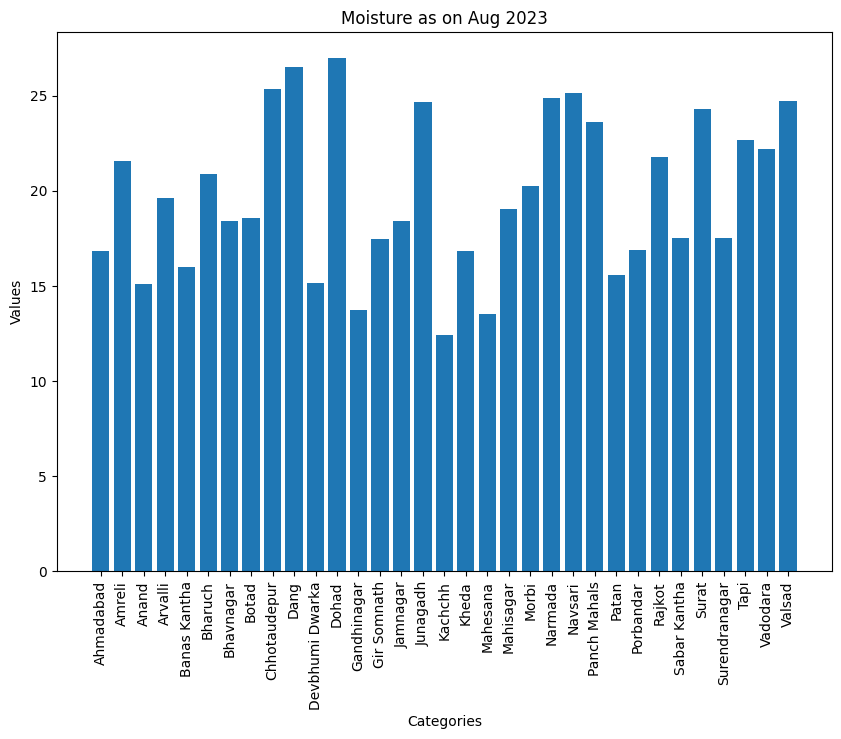

In [ ]:
plt.figure(figsize=(10, 7))
plt.bar(analysis_df['district'],analysis_df['2023-8'])

# Adding labels and a title
plt.xticks(rotation=90,fontsize=10)
plt.xlabel('Categories')
plt.ylabel('Values')
plt.title('Moisture as on Aug 2023')

# Display the plot
plt.show()

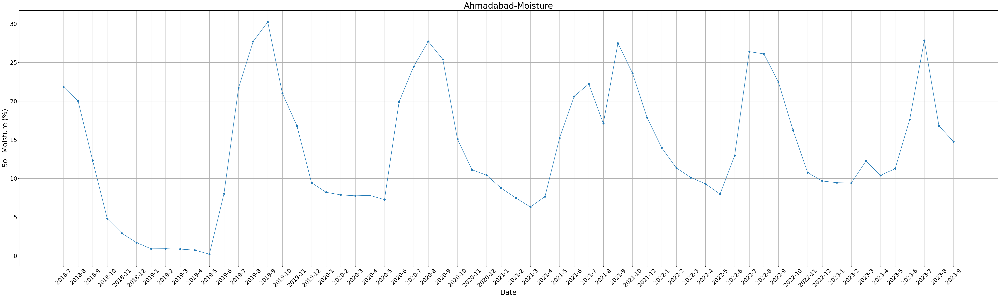

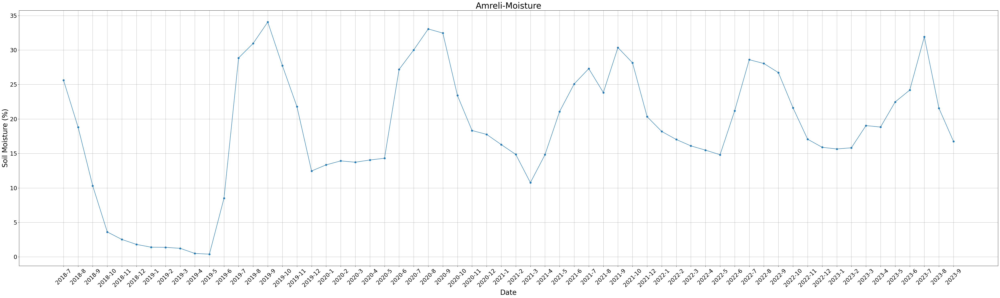

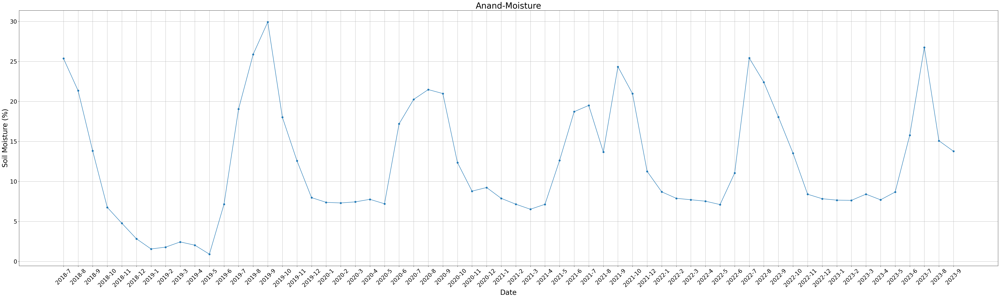

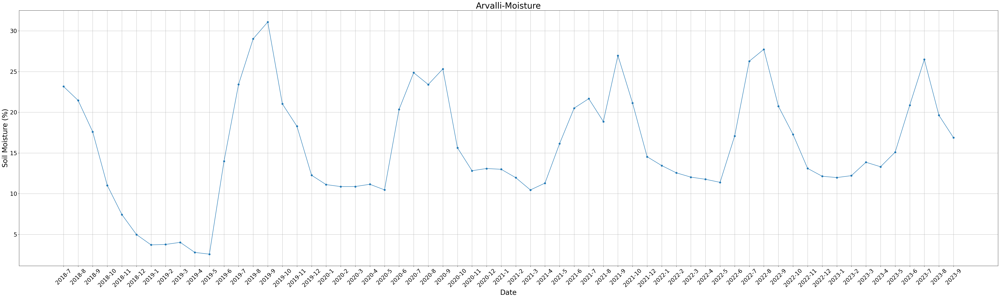

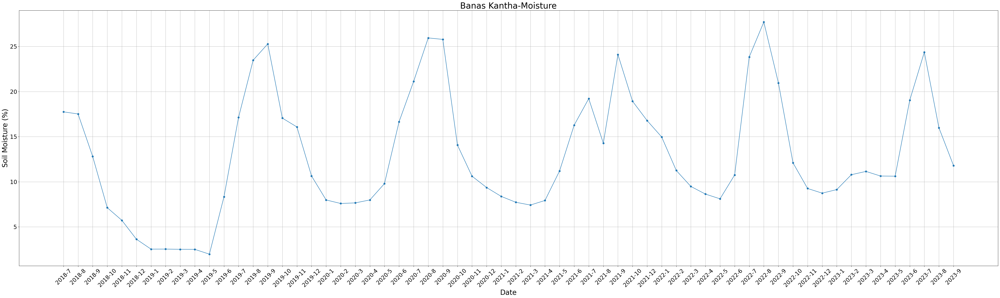

...

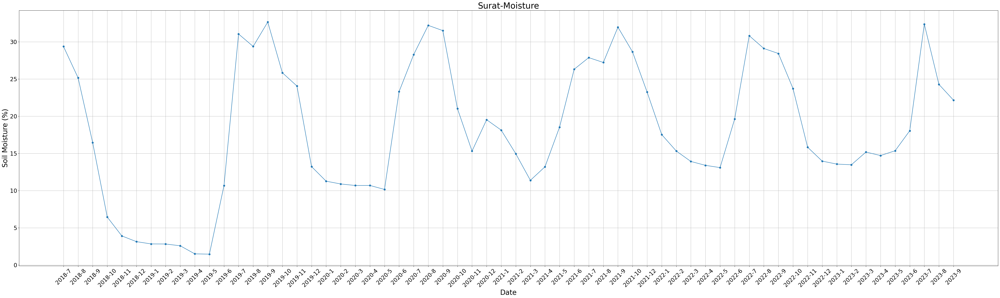

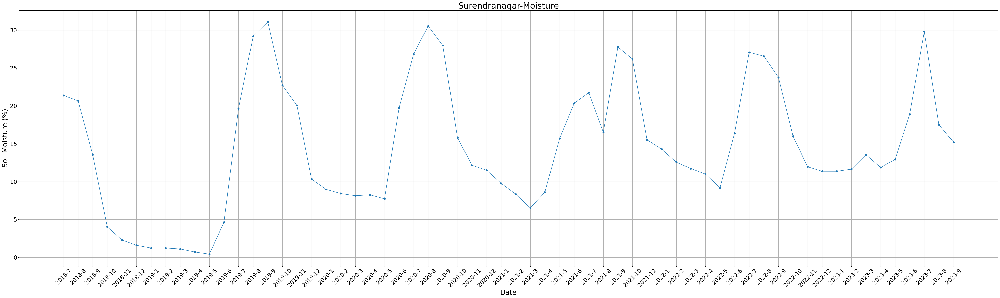

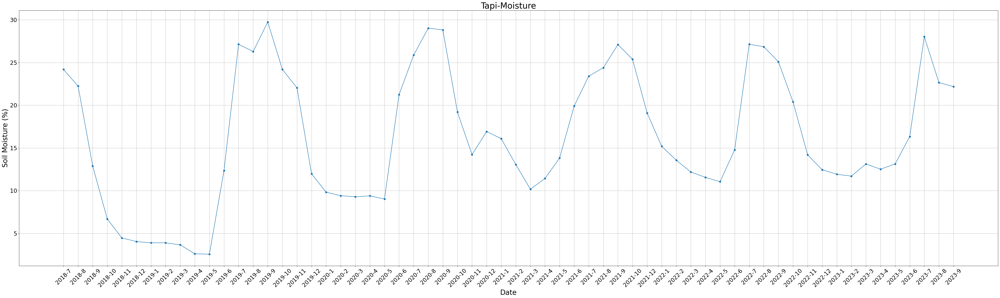

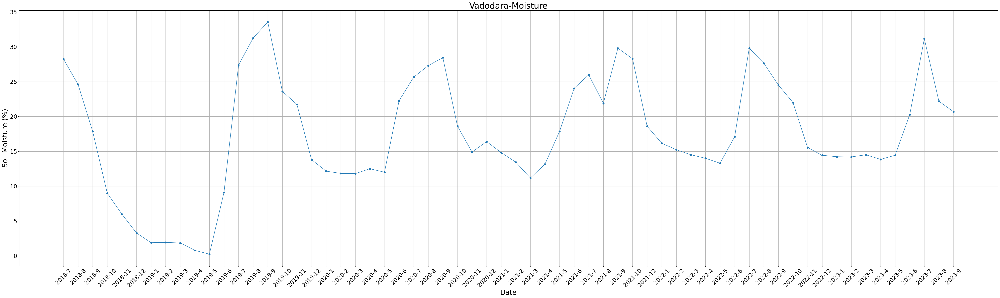

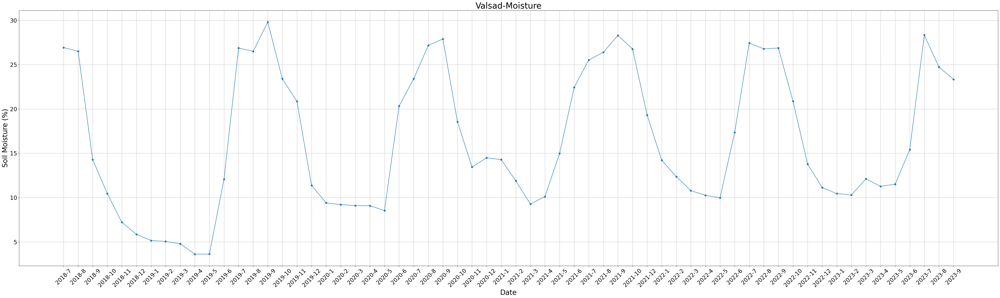

In [ ]:
co=list(analysis_df.columns)
co.pop()
co.pop()
co.pop(0)
co.pop(0)
df4

for j,i in enumerate(analysis_df.district):
  row_label_1 = list(analysis_df.loc[j])
  row_label_1.pop()
  row_label_1.pop()
  row_label_1.pop(0)
  row_label_1.pop(0)

  plt.figure(figsize=(50, 15))  # Adjust the figure size as needed

  plt.plot(co, row_label_1, marker='o', linestyle='-')  # Plot the data with markers and lines
  plt.title(f'{i}-Moisture', fontsize=30)  # Set the title
  plt.xlabel('Date', fontsize=25)  # Label for the x-axis
  plt.ylabel('Soil Moisture (%)', fontsize=25)  # Label for the y-axis

  # Rotate x-axis labels for better readability (optional)
  n=100
  plt.xticks(rotation=45,fontsize=20)
  plt.yticks(fontsize=20)
  plt.grid(True)  # Add a grid (optional)

  plt.tight_layout()  # Adjust layout to prevent clipping of labels

  # Display the plot
  plt.show()

In [ ]:
analysis_df

,Unnamed: 0,district,2018-7,2018-8,2018-9,2018-10,2018-11,2018-12,2019-1,2019-2,...,2023-2,2023-3,2023-4,2023-5,2023-6,2023-7,2023-8,2023-9,Latitude,Longitude
0,0,Ahmadabad,21.83750,20.015806,12.310000,4.800000,2.908333,1.701290,0.903548,0.914286,...,9.418889,12.251000,10.398333,11.262903,17.627000,27.843871,16.817742,14.754615,23.021624,72.579707
1,1,Amreli,25.63250,18.802258,10.318333,3.614839,2.527000,1.807097,1.405161,1.383571,...,15.819630,19.038333,18.829667,22.469355,24.185667,31.913871,21.563226,16.745385,20.866667,70.750000
2,2,Anand,25.37250,21.351935,13.817333,6.760968,4.767000,2.828387,1.555806,1.783571,...,7.631111,8.407333,7.700667,8.672903,15.775667,26.750000,15.090323,13.769231,22.558656,72.962723
3,3,Arvalli,23.16875,21.463226,17.603333,11.018065,7.433333,4.974516,3.701935,3.755000,...,12.208148,13.855667,13.303000,15.097742,20.869333,26.488710,19.628710,16.874615,23.483459,73.398812
4,4,Banas Kantha,17.74875,17.513226,12.809667,7.121290,5.719000,3.620968,2.522258,2.526429,...,10.776667,11.141333,10.629667,10.612581,19.032667,24.365161,15.986452,11.793077,24.250000,72.500000
5,5,Bharuch,27.98125,24.277742,16.734667,6.549032,3.959333,3.015806,1.865806,1.955357,...,13.382963,14.398667,13.563667,14.310968,18.361333,30.826129,20.898710,19.856923,21.708043,72.995694
6,6,Bhavnagar,25.18500,21.385484,13.200000,4.228065,2.847333,2.626129,2.195161,2.148929,...,12.580000,15.281000,14.547667,16.767742,21.962667,28.919677,18.403548,15.774615,21.771884,72.141645
7,7,Botad,20.47125,18.850323,10.591333,3.250323,2.263667,1.345161,0.809355,0.795000,...,14.117407,18.866667,17.291333,19.488065,21.171333,29.932581,18.555161,16.631538,22.168600,71.668500
8,8,Chhotaudepur,27.97250,25.217419,17.263667,9.003871,5.502000,4.117419,3.500645,3.490000,...,15.873333,17.084667,16.354000,18.235806,22.085667,30.991290,25.366774,24.500000,22.314874,74.014107
9,9,Dang,19.08750,24.264516,16.378000,13.757097,9.744667,8.117419,7.477097,7.380357,...,8.333333,12.808000,13.129333,14.068710,17.354333,25.220645,26.496774,22.720000,20.788172,73.709203
